In [5]:
import pandas as pd
import json
import numpy as np

In [6]:
!pip install dataprofiler

In [7]:
from dataprofiler import Data, Profiler

In [8]:
df=pd.read_csv('Sales.csv')
df

,Brands,Models,Colors,Memory,Storage,Camera,Rating,Selling Price,Original Price,Mobile,Discount,discount percentage
0,SAMSUNG,GALAXY M31S,Mirage Black,8 GB,128 GB,Yes,4.3,19330,20999,SAMSUNG GALAXY M31S,1669,7.947998
1,Nokia,3.2,Steel,2 GB,16 GB,Yes,3.8,10199,10199,Nokia 3.2,0,0.000000
2,realme,C2,Diamond Black,2 GB,NaN,Yes,4.4,6999,7999,realme C2,1000,12.501563
3,Infinix,Note 5,Ice Blue,4 GB,64 GB,Yes,4.2,12999,12999,Infinix Note 5,0,0.000000
4,Apple,iPhone 11,Black,4GB,64 GB,Yes,4.6,49900,49900,Apple iPhone 11,0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
3109,POCO,M4 Pro 5G,Cool Blue,6 GB,128 GB,Yes,4.4,16999,19999,POCO M4 Pro 5G,3000,15.000750
3110,Nokia,225,Black,NaN,Expandable Upto 32 GB,Yes,3.6,3499,3499,Nokia 225,0,0.000000
3111,Apple,iPhone SE,White,2 GB,128 GB,Yes,4.5,44900,44900,Apple iPhone SE,0,0.000000
3112,Apple,iPhone 13 Pro,Gold,6 GB,128 GB,Yes,NaN,119900,119900,Apple iPhone 13 Pro,0,0.000000


In [9]:
df=pd.read_csv("Sales.csv")
from dataprofiler import Data, Profiler
profile = Profiler(df)
report  = profile.report(report_options={"output_format":"pretty"})
print(json.dumps(report, indent=4))

INFO:DataProfiler.profilers.profile_builder: Finding the Null values in the columns... 


INFO:DataProfiler.profilers.profile_builder:Finding the Null values in the columns... 
100%|██████████| 12/12 [00:00<00:00, 78.36it/s]

INFO:DataProfiler.profilers.profile_builder: Calculating the statistics... 



INFO:DataProfiler.profilers.profile_builder:Calculating the statistics... 
100%|██████████| 12/12 [00:07<00:00,  1.57it/s]


{
    "global_stats": {
        "samples_used": 3114,
        "column_count": 12,
        "row_count": 3114,
        "row_has_null_ratio": 0.0697,
        "row_is_null_ratio": 0.0,
        "unique_row_ratio": 0.9653,
        "duplicate_row_count": 108,
        "file_type": "<class 'pandas.core.frame.DataFrame'>",
        "encoding": null,
        "correlation_matrix": null,
        "chi2_matrix": "[[ 1., nan, nan,  0.,  0.,  0.,  0., nan, nan, nan,  0.,  0.], ... , [ 0., nan, nan,  0.,  0.,  0.,  0., nan, nan, nan,  0.,  1.]]",
        "profile_schema": {
            "Brands": [
                0
            ],
            "Models": [
                1
            ],
            "Colors": [
                2
            ],
            "Memory": [
                3
            ],
            "Storage": [
                4
            ],
            "Camera": [
                5
            ],
            "Rating": [
                6
            ],
            "Selling Price": [
       

In [10]:
null_values = df.isnull().sum()
null_values

Brands                   0
Models                   0
Colors                   0
Memory                  43
Storage                 39
Camera                   0
Rating                 144
Selling Price            0
Original Price           0
Mobile                   0
Discount                 0
discount percentage      0
dtype: int64

In [11]:
duplicate_rows = df[df.duplicated()]
duplicate_rows

,Brands,Models,Colors,Memory,Storage,Camera,Rating,Selling Price,Original Price,Mobile,Discount,discount percentage
16,Apple,iPhone 13 Mini,Pink,6 GB,512 GB,Yes,NaN,99900,99900,Apple iPhone 13 Mini,0,0.000000
178,Apple,iPhone 11,White,4GB,256 GB,Yes,4.6,64900,64900,Apple iPhone 11,0,0.000000
338,Nokia,C01 Plus,Blue,2 GB,16 GB,Yes,NaN,6499,6499,Nokia C01 Plus,0,0.000000
765,SAMSUNG,Guru Music 2,Black,NaN,2 MB,Yes,4.3,1625,1625,SAMSUNG Guru Music 2,0,0.000000
775,Apple,iPhone 7,Gold,2 GB,32 GB,Yes,4.5,24999,31500,Apple iPhone 7,6501,20.638095
...,...,...,...,...,...,...,...,...,...,...,...,...
3041,Apple,iPhone SE,Red,2 GB,128 GB,Yes,4.5,44900,44900,Apple iPhone SE,0,0.000000
3052,Apple,iPhone 11,Purple,4GB,128 GB,Yes,4.6,54900,54900,Apple iPhone 11,0,0.000000
3071,Apple,iPhone 7,Red,2 GB,256 GB,Yes,4.7,74400,74400,Apple iPhone 7,0,0.000000
3110,Nokia,225,Black,NaN,Expandable Upto 32 GB,Yes,3.6,3499,3499,Nokia 225,0,0.000000


In [12]:
len(duplicate_rows)

108

In [13]:
df.describe()

,Rating,Selling Price,Original Price,Discount,discount percentage
count,2970.000000,3114.000000,3114.000000,3114.000000,3114.000000
mean,4.243098,26436.625562,28333.473025,1896.847463,6.086788
std,0.271991,30066.892622,31525.599889,5337.126176,11.106776
min,2.300000,1000.000000,1000.000000,-8000.000000,-160.320641
25%,4.100000,9990.000000,10030.250000,0.000000,0.000000
50%,4.300000,15000.000000,16889.500000,0.000000,0.000000
75%,4.400000,28999.000000,31500.000000,2000.000000,9.836388
max,5.000000,179900.000000,189999.000000,75000.000000,70.610305


In [14]:
df = df.applymap(lambda x: x.strip() if isinstance(x, str) else x)
df = df.applymap(lambda x: x.lower() if isinstance(x, str) else x)

In [15]:
df_cleaned = df.drop_duplicates(inplace=True)
df_cleaned

In [16]:
data_duplicates = df.duplicated().sum()
print(f"Number of duplicates after cleaning: {data_duplicates}")

Number of duplicates after cleaning: 0


In [17]:
missing_values_count = df.isnull().sum()
missing_values_count[:]

Brands                   0
Models                   0
Colors                   0
Memory                  40
Storage                 39
Camera                   0
Rating                 130
Selling Price            0
Original Price           0
Mobile                   0
Discount                 0
discount percentage      0
dtype: int64

In [18]:
total_cells = np.product(df.shape)
total_missing = missing_values_count.sum()
(total_missing/total_cells) * 100

0.5795895729339989

In [19]:
import pandas as pd
numerical_columns = ['Rating']
categorical_columns = ['Memory', 'Storage']
for col in numerical_columns:
    mean_value = df[col].mean()
    df[col].fillna(mean_value, inplace=True)
for col in categorical_columns:
    mode_value = df[col].mode()[0]
    df[col].fillna(mode_value, inplace=True)

In [20]:
final_missing = df.isnull().sum()
print("Final missing values by column:\n", final_missing)
total_cells = np.product(df.shape)
total_missing = final_missing.sum()
percentage_missing = (total_missing / total_cells) * 100
print("Percentage of missing data:", percentage_missing)

Final missing values by column:
 Brands                 0
Models                 0
Colors                 0
Memory                 0
Storage                0
Camera                 0
Rating                 0
Selling Price          0
Original Price         0
Mobile                 0
Discount               0
discount percentage    0
dtype: int64
Percentage of missing data: 0.0


Dealing with Outliers

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

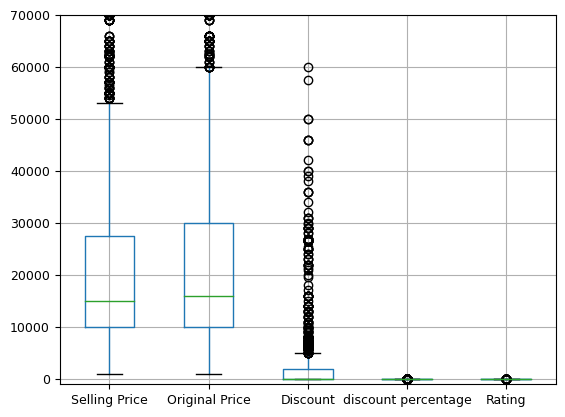

In [22]:
numerical_columns=['Selling Price',	'Original Price','Discount','discount percentage','Rating']

boxplot = df.boxplot(column=numerical_columns, grid=True, fontsize=9)
plt.ylim(-1000, 70000)
plt.show()

In [23]:
Q1 = df[numerical_columns].quantile(0.25)
Q3 = df[numerical_columns].quantile(0.75)
IQR = Q3-Q1
print('IQR Scores of columns:\n',IQR)

IQR Scores of columns:
 Selling Price          17524.000000
Original Price         19999.000000
Discount                2000.000000
discount percentage        9.867173
Rating                     0.300000
dtype: float64


In [24]:
df

,Brands,Models,Colors,Memory,Storage,Camera,Rating,Selling Price,Original Price,Mobile,Discount,discount percentage
0,samsung,galaxy m31s,mirage black,8 gb,128 gb,yes,4.300000,19330,20999,samsung galaxy m31s,1669,7.947998
1,nokia,3.2,steel,2 gb,16 gb,yes,3.800000,10199,10199,nokia 3.2,0,0.000000
2,realme,c2,diamond black,2 gb,64 gb,yes,4.400000,6999,7999,realme c2,1000,12.501563
3,infinix,note 5,ice blue,4 gb,64 gb,yes,4.200000,12999,12999,infinix note 5,0,0.000000
4,apple,iphone 11,black,4gb,64 gb,yes,4.600000,49900,49900,apple iphone 11,0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
3107,samsung,galaxy s duos 2,black,512 mb,4 gb,yes,4.000000,5999,5999,samsung galaxy s duos 2,0,0.000000
3108,samsung,metro 313,black,4 mb,2 mb,yes,4.200000,2299,2299,samsung metro 313,0,0.000000
3109,poco,m4 pro 5g,cool blue,6 gb,128 gb,yes,4.400000,16999,19999,poco m4 pro 5g,3000,15.000750
3112,apple,iphone 13 pro,gold,6 gb,128 gb,yes,4.236139,119900,119900,apple iphone 13 pro,0,0.000000


In [25]:
Q1 = df['Selling Price'].quantile(0.25)
Q3 = df['Selling Price'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
filtered_df = df[(df['Selling Price'] >= lower_bound) & (df['Selling Price'] <= upper_bound)]
print("Original DataFrame size:", df.shape[0])
print("Filtered DataFrame size:", filtered_df.shape[0])
print("Number of outliers removed:", df.shape[0] - filtered_df.shape[0])


Original DataFrame size: 3005
Filtered DataFrame size: 2628
Number of outliers removed: 377


In [26]:
Q1_orig_price = df['Original Price'].quantile(0.25)
Q3_orig_price = df['Original Price'].quantile(0.75)
IQR_orig_price = Q3_orig_price - Q1_orig_price
lower_bound_orig_price = Q1_orig_price - 1.5 * IQR_orig_price
upper_bound_orig_price = Q3_orig_price + 1.5 * IQR_orig_price
filtered_df_orig_price = df[(df['Original Price'] >= lower_bound_orig_price) & (df['Original Price'] <= upper_bound_orig_price)]

print("Original Price - Filtered DataFrame size:", filtered_df_orig_price.shape[0])


Original Price - Filtered DataFrame size: 2661


In [27]:
Q1_discount = df['Discount'].quantile(0.25)
Q3_discount = df['Discount'].quantile(0.75)
IQR_discount = Q3_discount - Q1_discount
lower_bound_discount = Q1_discount - 1.5 * IQR_discount
upper_bound_discount = Q3_discount + 1.5 * IQR_discount
filtered_df_discount = df[(df['Discount'] >= lower_bound_discount) & (df['Discount'] <= upper_bound_discount)]

print("Discount - Filtered DataFrame size:", filtered_df_discount.shape[0])


Discount - Filtered DataFrame size: 2756


In [28]:
Q1_disc_perc = df['discount percentage'].quantile(0.25)
Q3_disc_perc = df['discount percentage'].quantile(0.75)
IQR_disc_perc = Q3_disc_perc - Q1_disc_perc
lower_bound_disc_perc = Q1_disc_perc - 1.5 * IQR_disc_perc
upper_bound_disc_perc = Q3_disc_perc + 1.5 * IQR_disc_perc
filtered_df_disc_perc = df[(df['discount percentage'] >= lower_bound_disc_perc) & (df['discount percentage'] <= upper_bound_disc_perc)]

print("Discount Percentage - Filtered DataFrame size:", filtered_df_disc_perc.shape[0])


Discount Percentage - Filtered DataFrame size: 2808


In [29]:
Q1_rating = df['Rating'].quantile(0.25)
Q3_rating = df['Rating'].quantile(0.75)
IQR_rating = Q3_rating - Q1_rating
lower_bound_rating = Q1_rating - 1.5 * IQR_rating
upper_bound_rating = Q3_rating + 1.5 * IQR_rating
filtered_df_rating = df[(df['Rating'] >= lower_bound_rating) & (df['Rating'] <= upper_bound_rating)]

print("Rating - Filtered DataFrame size:", filtered_df_rating.shape[0])


Rating - Filtered DataFrame size: 2917


3-Data Validation

In [30]:
!pip install pandera

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.6/251.6 kB 3.8 MB/s eta 0:00:00


In [31]:
import pandera as pa
from pandera import Column, DataFrameSchema, Check, Index

In [32]:
import pandera as pa
from pandera import Column, Check

# Define the schema for your dataset
mobile_sales_schema = pa.DataFrameSchema({
    "Brands": Column(str),
    "Models": Column(str),
    "Colors": Column(str),
    "Memory": Column(str),
    "Storage": Column(str),
    "Camera": Column(str, Check(lambda x: x.str.title().isin(["Yes", "No"]))),
    "Rating": Column(float, Check.in_range(1.0, 5.0)),
    "Selling Price": Column(int, Check.greater_than_or_equal_to(0)),  # Adjusted to int
    "Original Price": Column(int, Check.greater_than_or_equal_to(0)),  # Adjusted to int
    "Mobile": Column(str),
    "Discount": Column(int, Check.greater_than_or_equal_to(0)),  # Adjusted to int
    "discount percentage": Column(float, Check.in_range(0, 100))
})
df = df[df['Discount'] >= 0]

validated_df = mobile_sales_schema(df)
print(validated_df.head())

    Brands       Models         Colors Memory Storage Camera  Rating  \
0  samsung  galaxy m31s   mirage black   8 gb  128 gb    yes     4.3   
1    nokia          3.2          steel   2 gb   16 gb    yes     3.8   
2   realme           c2  diamond black   2 gb   64 gb    yes     4.4   
3  infinix       note 5       ice blue   4 gb   64 gb    yes     4.2   
4    apple    iphone 11          black    4gb   64 gb    yes     4.6   

   Selling Price  Original Price               Mobile  Discount  \
0          19330           20999  samsung galaxy m31s      1669   
1          10199           10199            nokia 3.2         0   
2           6999            7999            realme c2      1000   
3          12999           12999       infinix note 5         0   
4          49900           49900      apple iphone 11         0   

   discount percentage  
0             7.947998  
1             0.000000  
2            12.501563  
3             0.000000  
4             0.000000  


In [33]:
try:
    mobile_sales_schema.validate(df, lazy=True)
except pa.errors.SchemaError as exc:
    failure_cases_df = exc.failure_cases
    display(failure_cases_df)

In [34]:
!pip install pandera[io]
inferred_schema = pa.infer_schema(df).to_script()
print(inferred_schema)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 419.5/419.5 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 414.1/414.1 kB 18.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.9/42.9 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 3.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for petl: filename=petl-1.7.15-py3-none-any.whl size=230718 sha256=9d37535e4bf7673aa10bc710189e6b05df3b5b58605a888eb0f79786b237b91b
  Stored in directory: /root/.cache/pip/wheels/25/98/91/62fbf9f9cb32952d7d91532152b893f7eab007f6aea750a3f5
  Created wheel for stringcase: filename=stringcase-1.2.0-py3-none-any.whl size=3569 sha256=8afcde9b2d3223069e50ab8e3415dde89ffd932f3d1b33cc8dc79fcda0bae5b7
  Store

In [35]:
!pip install faker

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 11.2 MB/s eta 0:00:00


In [36]:
 !pip install anonymizedf

In [37]:
from anonymizedf.anonymizedf import anonymize

In [38]:

an = anonymize(df)
an.fake_names("Models")
df

/usr/local/lib/python3.10/dist-packages/anonymizedf/anonymizedf.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._df[f"Fake_{original_name}"] = [


,Brands,Models,Colors,Memory,Storage,Camera,Rating,Selling Price,Original Price,Mobile,Discount,discount percentage,Fake_Models
0,samsung,galaxy m31s,mirage black,8 gb,128 gb,yes,4.300000,19330,20999,samsung galaxy m31s,1669,7.947998,Rita Wilson
1,nokia,3.2,steel,2 gb,16 gb,yes,3.800000,10199,10199,nokia 3.2,0,0.000000,Cheryl Nelson
2,realme,c2,diamond black,2 gb,64 gb,yes,4.400000,6999,7999,realme c2,1000,12.501563,Mitchell Davison
3,infinix,note 5,ice blue,4 gb,64 gb,yes,4.200000,12999,12999,infinix note 5,0,0.000000,Beverley Chamberlain
4,apple,iphone 11,black,4gb,64 gb,yes,4.600000,49900,49900,apple iphone 11,0,0.000000,Barry Jackson
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3107,samsung,galaxy s duos 2,black,512 mb,4 gb,yes,4.000000,5999,5999,samsung galaxy s duos 2,0,0.000000,Bruce Williams
3108,samsung,metro 313,black,4 mb,2 mb,yes,4.200000,2299,2299,samsung metro 313,0,0.000000,Howard Carroll
3109,poco,m4 pro 5g,cool blue,6 gb,128 gb,yes,4.400000,16999,19999,poco m4 pro 5g,3000,15.000750,Lisa Gardner
3112,apple,iphone 13 pro,gold,6 gb,128 gb,yes,4.236139,119900,119900,apple iphone 13 pro,0,0.000000,Gavin James


In [39]:
def add_noise(dfp, column, std = None):
    if std == None:
        std = dfp[column].std()

    withNoise = dfp[column].add(np.random.normal(0, std, dfp.shape[0]))
    copy = dfp.copy()
    copy[column] = withNoise
    return copy

perturbation = add_noise(df, 'Selling Price', std=100)
perturbation

,Brands,Models,Colors,Memory,Storage,Camera,Rating,Selling Price,Original Price,Mobile,Discount,discount percentage,Fake_Models
0,samsung,galaxy m31s,mirage black,8 gb,128 gb,yes,4.300000,19314.737242,20999,samsung galaxy m31s,1669,7.947998,Rita Wilson
1,nokia,3.2,steel,2 gb,16 gb,yes,3.800000,10159.802515,10199,nokia 3.2,0,0.000000,Cheryl Nelson
2,realme,c2,diamond black,2 gb,64 gb,yes,4.400000,6926.110501,7999,realme c2,1000,12.501563,Mitchell Davison
3,infinix,note 5,ice blue,4 gb,64 gb,yes,4.200000,13001.131357,12999,infinix note 5,0,0.000000,Beverley Chamberlain
4,apple,iphone 11,black,4gb,64 gb,yes,4.600000,50151.041425,49900,apple iphone 11,0,0.000000,Barry Jackson
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3107,samsung,galaxy s duos 2,black,512 mb,4 gb,yes,4.000000,6134.671040,5999,samsung galaxy s duos 2,0,0.000000,Bruce Williams
3108,samsung,metro 313,black,4 mb,2 mb,yes,4.200000,2200.880795,2299,samsung metro 313,0,0.000000,Howard Carroll
3109,poco,m4 pro 5g,cool blue,6 gb,128 gb,yes,4.400000,16971.556656,19999,poco m4 pro 5g,3000,15.000750,Lisa Gardner
3112,apple,iphone 13 pro,gold,6 gb,128 gb,yes,4.236139,119831.365828,119900,apple iphone 13 pro,0,0.000000,Gavin James


In [40]:
df['Storage'] = df['Storage'].replace({'16 gb': 'Low', '32 gb': 'Low', '64 gb': 'Medium', '128 gb': 'High', '256 gb': 'High','4 gb':'very low','2 mb':'extrem low'})
df

<ipython-input-40-59dedd30801b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Storage'] = df['Storage'].replace({'16 gb': 'Low', '32 gb': 'Low', '64 gb': 'Medium', '128 gb': 'High', '256 gb': 'High','4 gb':'very low','2 mb':'extrem low'})


,Brands,Models,Colors,Memory,Storage,Camera,Rating,Selling Price,Original Price,Mobile,Discount,discount percentage,Fake_Models
0,samsung,galaxy m31s,mirage black,8 gb,High,yes,4.300000,19330,20999,samsung galaxy m31s,1669,7.947998,Rita Wilson
1,nokia,3.2,steel,2 gb,Low,yes,3.800000,10199,10199,nokia 3.2,0,0.000000,Cheryl Nelson
2,realme,c2,diamond black,2 gb,Medium,yes,4.400000,6999,7999,realme c2,1000,12.501563,Mitchell Davison
3,infinix,note 5,ice blue,4 gb,Medium,yes,4.200000,12999,12999,infinix note 5,0,0.000000,Beverley Chamberlain
4,apple,iphone 11,black,4gb,Medium,yes,4.600000,49900,49900,apple iphone 11,0,0.000000,Barry Jackson
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3107,samsung,galaxy s duos 2,black,512 mb,very low,yes,4.000000,5999,5999,samsung galaxy s duos 2,0,0.000000,Bruce Williams
3108,samsung,metro 313,black,4 mb,extrem low,yes,4.200000,2299,2299,samsung metro 313,0,0.000000,Howard Carroll
3109,poco,m4 pro 5g,cool blue,6 gb,High,yes,4.400000,16999,19999,poco m4 pro 5g,3000,15.000750,Lisa Gardner
3112,apple,iphone 13 pro,gold,6 gb,High,yes,4.236139,119900,119900,apple iphone 13 pro,0,0.000000,Gavin James


In [41]:
import random as r
def scramble_data(data):
    data_list = list(data)
    r.shuffle(data_list)
    return ''.join(data_list)

df['Scrambled_Colors'] = df['Colors'].apply(scramble_data)

print(df[['Colors', 'Scrambled_Colors']].head())

          Colors Scrambled_Colors
0   mirage black     lgci mkraaeb
1          steel            tesle
2  diamond black     okmddbaalnic
3       ice blue          ebcleui
4          black            bakcl


<ipython-input-41-49f2010302ab>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Scrambled_Colors'] = df['Colors'].apply(scramble_data)


2-Hashing:converting data into a fixed-size string of bytes using a hash function.

In [42]:
import hashlib

In [43]:
df['Hashed_Mobile'] = df['Mobile'].apply(lambda x: hashlib.sha256(x.encode()).hexdigest())
df

<ipython-input-43-e651d8ee11ca>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hashed_Mobile'] = df['Mobile'].apply(lambda x: hashlib.sha256(x.encode()).hexdigest())


,Brands,Models,Colors,Memory,Storage,Camera,Rating,Selling Price,Original Price,Mobile,Discount,discount percentage,Fake_Models,Scrambled_Colors,Hashed_Mobile
0,samsung,galaxy m31s,mirage black,8 gb,High,yes,4.300000,19330,20999,samsung galaxy m31s,1669,7.947998,Rita Wilson,lgci mkraaeb,98daa93b7cb743270917588a471f0e6185db0506519dd7...
1,nokia,3.2,steel,2 gb,Low,yes,3.800000,10199,10199,nokia 3.2,0,0.000000,Cheryl Nelson,tesle,9b7d7e8c6c68b3e44e004fc2f977e4048490b8d37a57f2...
2,realme,c2,diamond black,2 gb,Medium,yes,4.400000,6999,7999,realme c2,1000,12.501563,Mitchell Davison,okmddbaalnic,02fd209d468dd5e04d51a62c08386661f71378dc8f256e...
3,infinix,note 5,ice blue,4 gb,Medium,yes,4.200000,12999,12999,infinix note 5,0,0.000000,Beverley Chamberlain,ebcleui,f3a64ae6037224d29fb60523feb221076a2684229d9950...
4,apple,iphone 11,black,4gb,Medium,yes,4.600000,49900,49900,apple iphone 11,0,0.000000,Barry Jackson,bakcl,b7c4c5257088f04842e0e7add86d149b1272247ba236c5...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3107,samsung,galaxy s duos 2,black,512 mb,very low,yes,4.000000,5999,5999,samsung galaxy s duos 2,0,0.000000,Bruce Williams,lacbk,658e19385c1ea4ad1ac9e0d7f6e29fef9b4d896b22dc6b...
3108,samsung,metro 313,black,4 mb,extrem low,yes,4.200000,2299,2299,samsung metro 313,0,0.000000,Howard Carroll,klbac,5504ac2dcdfaebdaef1683fc031053b3e78feed24bf678...
3109,poco,m4 pro 5g,cool blue,6 gb,High,yes,4.400000,16999,19999,poco m4 pro 5g,3000,15.000750,Lisa Gardner,luboc oel,b10f68fb3c9be268a974d5dcdd138434aef7e783d5fc0b...
3112,apple,iphone 13 pro,gold,6 gb,High,yes,4.236139,119900,119900,apple iphone 13 pro,0,0.000000,Gavin James,glod,bf1de63408540a1d1dbb153a2bc5b1d7eef4383985318f...


In [44]:
from cryptography.fernet import Fernet

In [45]:
key = Fernet.generate_key()
cipher = Fernet(key)
df['Encrypted_Brands'] = df['Brands'].apply(lambda x: cipher.encrypt(x.encode()).decode())
df

<ipython-input-45-87824a5b3d9e>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Encrypted_Brands'] = df['Brands'].apply(lambda x: cipher.encrypt(x.encode()).decode())


,Brands,Models,Colors,Memory,Storage,Camera,Rating,Selling Price,Original Price,Mobile,Discount,discount percentage,Fake_Models,Scrambled_Colors,Hashed_Mobile,Encrypted_Brands
0,samsung,galaxy m31s,mirage black,8 gb,High,yes,4.300000,19330,20999,samsung galaxy m31s,1669,7.947998,Rita Wilson,lgci mkraaeb,98daa93b7cb743270917588a471f0e6185db0506519dd7...,gAAAAABmQPNG4z8su63prRO-cegzsuNPEoo4J72tlnPRl5...
1,nokia,3.2,steel,2 gb,Low,yes,3.800000,10199,10199,nokia 3.2,0,0.000000,Cheryl Nelson,tesle,9b7d7e8c6c68b3e44e004fc2f977e4048490b8d37a57f2...,gAAAAABmQPNGTOjQB8C-Y-d4fjLws4YQIHt6wOWb8Fs-lP...
2,realme,c2,diamond black,2 gb,Medium,yes,4.400000,6999,7999,realme c2,1000,12.501563,Mitchell Davison,okmddbaalnic,02fd209d468dd5e04d51a62c08386661f71378dc8f256e...,gAAAAABmQPNGe2uwxNypj2Ns8NmFNJDLfolSDehx5QaTFI...
3,infinix,note 5,ice blue,4 gb,Medium,yes,4.200000,12999,12999,infinix note 5,0,0.000000,Beverley Chamberlain,ebcleui,f3a64ae6037224d29fb60523feb221076a2684229d9950...,gAAAAABmQPNGgdGzOfblAfImXDkf0mm5BbzvyCAulEJr3J...
4,apple,iphone 11,black,4gb,Medium,yes,4.600000,49900,49900,apple iphone 11,0,0.000000,Barry Jackson,bakcl,b7c4c5257088f04842e0e7add86d149b1272247ba236c5...,gAAAAABmQPNG97YN5ufEZW5L_RsJnSK3qt3lDRgzCSWaRm...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3107,samsung,galaxy s duos 2,black,512 mb,very low,yes,4.000000,5999,5999,samsung galaxy s duos 2,0,0.000000,Bruce Williams,lacbk,658e19385c1ea4ad1ac9e0d7f6e29fef9b4d896b22dc6b...,gAAAAABmQPNHtqm9NqhocjebE9C06nqxK1dhdXYqRGpSoZ...
3108,samsung,metro 313,black,4 mb,extrem low,yes,4.200000,2299,2299,samsung metro 313,0,0.000000,Howard Carroll,klbac,5504ac2dcdfaebdaef1683fc031053b3e78feed24bf678...,gAAAAABmQPNHrD4myv_4oW9cgzIyBd_MZWjeUCSWPei16Q...
3109,poco,m4 pro 5g,cool blue,6 gb,High,yes,4.400000,16999,19999,poco m4 pro 5g,3000,15.000750,Lisa Gardner,luboc oel,b10f68fb3c9be268a974d5dcdd138434aef7e783d5fc0b...,gAAAAABmQPNHD4r8Vu-G3qEBIYz0phrm4BFGGgJGjVDOwR...
3112,apple,iphone 13 pro,gold,6 gb,High,yes,4.236139,119900,119900,apple iphone 13 pro,0,0.000000,Gavin James,glod,bf1de63408540a1d1dbb153a2bc5b1d7eef4383985318f...,gAAAAABmQPNHKPdiYjnY-vQsxYgxVARhXI7SbtAVG2InaK...


In [46]:
pd.set_option('display.max_rows', None)  # None means show all rows
pd.set_option('display.max_columns', None)  # None means show all columns
pd.set_option('display.width', None)  # Use to ensure the display is not wrapped
pd.set_option('display.max_colwidth', None)  # Display full width of columns

# Now print the DataFrame
print(df)

            Brands                                    Models                 Colors  Memory  \
0          samsung                               galaxy m31s           mirage black    8 gb   
1            nokia                                       3.2                  steel    2 gb   
2           realme                                        c2          diamond black    2 gb   
3          infinix                                    note 5               ice blue    4 gb   
4            apple                                 iphone 11                  black     4gb   
5           gionee                                      l800                  black    8 mb   
6            apple                            iphone 13 mini                   pink    6 gb   
7            apple                                 iphone xr                  coral    3 gb   
8          samsung                                 galaxy e5                  brown  1.5 gb   
9           xiaomi                         redmi n

In [47]:
!pip install openpyxl


In [48]:
from google.colab import files

In [49]:
df.to_excel('data_output.xlsx', index=False, engine='openpyxl')

# Download the file
files.download('data_output.xlsx')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [50]:
class MACPolicy:
    def __init__(self):
        self.access_rules = {}

    def add_access_rule(self, subject, resource, action):
        if resource not in self.access_rules:
            self.access_rules[resource] = {}
        if action not in self.access_rules[resource]:
            self.access_rules[resource][action] = []
        self.access_rules[resource][action].append(subject)

    def check_access(self, subject, resource, action):
        if resource in self.access_rules and action in self.access_rules[resource]:
            return subject in self.access_rules[resource][action]
        return False

In [52]:
mac_policy = MACPolicy()

# Define access rules
mac_policy.add_access_rule("admin", "Sales.csv", "read")
mac_policy.add_access_rule("admin", "Sales.csv", "write")
mac_policy.add_access_rule("user", "Sales.csv", "read")

In [53]:
# Check access before modifying the DataFrame
print(mac_policy.check_access("admin", "Sales.csv", "read"))
print(mac_policy.check_access("user", "Sales.csv", "write"))

True
False


In [55]:
if mac_policy.check_access("admin", "Sales.csv", "write"):
    # Add a new column 'status' with default value 'active' for all rows
    df['status'] = 'active'
df

<ipython-input-55-2484b95965bb>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['status'] = 'active'


,Brands,Models,Colors,Memory,Storage,Camera,Rating,Selling Price,Original Price,Mobile,Discount,discount percentage,Fake_Models,Scrambled_Colors,Hashed_Mobile,Encrypted_Brands,status
0,samsung,galaxy m31s,mirage black,8 gb,High,yes,4.300000,19330,20999,samsung galaxy m31s,1669,7.947998,Rita Wilson,lgci mkraaeb,98daa93b7cb743270917588a471f0e6185db0506519dd723985ed7f8058774c6,gAAAAABmQPNG4z8su63prRO-cegzsuNPEoo4J72tlnPRl5tyAuRKHd0RKsEepjd27Zil_Mpd1U3DUF_Oh_brV3VaEMTi2TF4aQ==,active
1,nokia,3.2,steel,2 gb,Low,yes,3.800000,10199,10199,nokia 3.2,0,0.000000,Cheryl Nelson,tesle,9b7d7e8c6c68b3e44e004fc2f977e4048490b8d37a57f283907e3e3e9e52e0b7,gAAAAABmQPNGTOjQB8C-Y-d4fjLws4YQIHt6wOWb8Fs-lP5mRnpDItcOzdH6Qi5C-sxhxA2OqunbHXobj7TPnU_O8YBGo0KNUA==,active
2,realme,c2,diamond black,2 gb,Medium,yes,4.400000,6999,7999,realme c2,1000,12.501563,Mitchell Davison,okmddbaalnic,02fd209d468dd5e04d51a62c08386661f71378dc8f256e93932c93e8ecda3fb1,gAAAAABmQPNGe2uwxNypj2Ns8NmFNJDLfolSDehx5QaTFIn5ZE_-iH-s9yXie1uqSHb11wBP9GSZkhHuRNBc4WHoXYzo7uJ6jg==,active
3,infinix,note 5,ice blue,4 gb,Medium,yes,4.200000,12999,12999,infinix note 5,0,0.000000,Beverley Chamberlain,ebcleui,f3a64ae6037224d29fb60523feb221076a2684229d9950948c4da5b10176e168,gAAAAABmQPNGgdGzOfblAfImXDkf0mm5BbzvyCAulEJr3JM_sNIjdt2bZzSZYyJMLNytK5VthAZ0MR_lpvCESM_NcQGLhri1ug==,active
4,apple,iphone 11,black,4gb,Medium,yes,4.600000,49900,49900,apple iphone 11,0,0.000000,Barry Jackson,bakcl,b7c4c5257088f04842e0e7add86d149b1272247ba236c5af785adc51e5e40c8c,gAAAAABmQPNG97YN5ufEZW5L_RsJnSK3qt3lDRgzCSWaRm3tVvI8wEndDb1YJdjacpZUAdBoUj4vobiTZ3XPhGLG2sHn0_JbIw==,active
5,gionee,l800,black,8 mb,16 mb,yes,4.000000,2199,2199,gionee l800,0,0.000000,Abbie Moore,lckba,56df3461005c6021bc67f15fc7481355016bbdea9e44f29e2ed9927bfbda9c25,gAAAAABmQPNGN84bllEqDXcpO5YoukJ1tmD-qoCl5T-xzUL_hhGGXA_E7hc9HH0_OWkaeGhKu9eYQ04CowqECCdqi2rAXXrysw==,active
6,apple,iphone 13 mini,pink,6 gb,512 gb,yes,4.236139,99900,99900,apple iphone 13 mini,0,0.000000,Miss Yvonne Rhodes,knpi,60634d7d484eefb4a41d133a3eb9fffd9b696f8e65e09c197bd57009cc529887,gAAAAABmQPNGIVvlnURUmFfH6drGUl3t8ykpqhYaOWjG_Ww5oov8KkXb9Z2n9YOxYHeEliKpLGwO_5EaOAzPylU1vqPjm_3eyg==,active
7,apple,iphone xr,coral,3 gb,Medium,yes,4.600000,42999,47900,apple iphone xr,4901,10.231733,Ms Charlene Gibson,ocarl,5705ecb2c357fec69ba98c928b08ac2f7cecf4b9bd3048cb983383f3512e5757,gAAAAABmQPNGMBt2SAyEZJAiDNOSwetXXHBBFafVH6NuVtK5vXZ9leoQ2_zmtLFsEcjXp52zKLh_WmfUyl_6KmzpfTEte-ZlKw==,active
8,samsung,galaxy e5,brown,1.5 gb,Low,yes,4.200000,20400,20400,samsung galaxy e5,0,0.000000,Dr Joan Taylor,bnowr,05d45232c881719fdacf3b3fc9145d59bde39db9dd581ae8e657ea582f9cc90b,gAAAAABmQPNGWkyIEvxrcrPmbs3oMcvyNkpsuXyxvOyOk04mhfcqpahToKG1POl1UQnXVLJ4JC-2QDVEB-w9B1LqBWFACp8mhw==,active
9,xiaomi,redmi note 11t 5g,aquamarine blue,8 gb,High,yes,4.300000,21736,22999,xiaomi redmi note 11t 5g,1263,5.491543,Kim Murray,ubamqn eealariu,0cceb44d96b5dd64fac1cb492db4b73b1b81dfaf6a41876b11c60ce6b0120a94,gAAAAABmQPNGGLxNlMAkB8KQiJ_bQa0jqzQsJ7jDA7DWct1jo8XY2v_WtISa4LeFetWLKLQ48ba2kojoGaNx2lwGwtukht6EMg==,active


In [58]:
# Modify the DataFrame (for example)
if mac_policy.check_access("admin", "Sales.csv", "write"):
    df.loc[df['Original Price'] > 3000, 'status'] = 'inactive'

# df.to_csv("modified_data.csv", index=False)
df

,Brands,Models,Colors,Memory,Storage,Camera,Rating,Selling Price,Original Price,Mobile,Discount,discount percentage,Fake_Models,Scrambled_Colors,Hashed_Mobile,Encrypted_Brands,status
0,samsung,galaxy m31s,mirage black,8 gb,High,yes,4.300000,19330,20999,samsung galaxy m31s,1669,7.947998,Rita Wilson,lgci mkraaeb,98daa93b7cb743270917588a471f0e6185db0506519dd723985ed7f8058774c6,gAAAAABmQPNG4z8su63prRO-cegzsuNPEoo4J72tlnPRl5tyAuRKHd0RKsEepjd27Zil_Mpd1U3DUF_Oh_brV3VaEMTi2TF4aQ==,inactive
1,nokia,3.2,steel,2 gb,Low,yes,3.800000,10199,10199,nokia 3.2,0,0.000000,Cheryl Nelson,tesle,9b7d7e8c6c68b3e44e004fc2f977e4048490b8d37a57f283907e3e3e9e52e0b7,gAAAAABmQPNGTOjQB8C-Y-d4fjLws4YQIHt6wOWb8Fs-lP5mRnpDItcOzdH6Qi5C-sxhxA2OqunbHXobj7TPnU_O8YBGo0KNUA==,inactive
2,realme,c2,diamond black,2 gb,Medium,yes,4.400000,6999,7999,realme c2,1000,12.501563,Mitchell Davison,okmddbaalnic,02fd209d468dd5e04d51a62c08386661f71378dc8f256e93932c93e8ecda3fb1,gAAAAABmQPNGe2uwxNypj2Ns8NmFNJDLfolSDehx5QaTFIn5ZE_-iH-s9yXie1uqSHb11wBP9GSZkhHuRNBc4WHoXYzo7uJ6jg==,inactive
3,infinix,note 5,ice blue,4 gb,Medium,yes,4.200000,12999,12999,infinix note 5,0,0.000000,Beverley Chamberlain,ebcleui,f3a64ae6037224d29fb60523feb221076a2684229d9950948c4da5b10176e168,gAAAAABmQPNGgdGzOfblAfImXDkf0mm5BbzvyCAulEJr3JM_sNIjdt2bZzSZYyJMLNytK5VthAZ0MR_lpvCESM_NcQGLhri1ug==,inactive
4,apple,iphone 11,black,4gb,Medium,yes,4.600000,49900,49900,apple iphone 11,0,0.000000,Barry Jackson,bakcl,b7c4c5257088f04842e0e7add86d149b1272247ba236c5af785adc51e5e40c8c,gAAAAABmQPNG97YN5ufEZW5L_RsJnSK3qt3lDRgzCSWaRm3tVvI8wEndDb1YJdjacpZUAdBoUj4vobiTZ3XPhGLG2sHn0_JbIw==,inactive
5,gionee,l800,black,8 mb,16 mb,yes,4.000000,2199,2199,gionee l800,0,0.000000,Abbie Moore,lckba,56df3461005c6021bc67f15fc7481355016bbdea9e44f29e2ed9927bfbda9c25,gAAAAABmQPNGN84bllEqDXcpO5YoukJ1tmD-qoCl5T-xzUL_hhGGXA_E7hc9HH0_OWkaeGhKu9eYQ04CowqECCdqi2rAXXrysw==,active
6,apple,iphone 13 mini,pink,6 gb,512 gb,yes,4.236139,99900,99900,apple iphone 13 mini,0,0.000000,Miss Yvonne Rhodes,knpi,60634d7d484eefb4a41d133a3eb9fffd9b696f8e65e09c197bd57009cc529887,gAAAAABmQPNGIVvlnURUmFfH6drGUl3t8ykpqhYaOWjG_Ww5oov8KkXb9Z2n9YOxYHeEliKpLGwO_5EaOAzPylU1vqPjm_3eyg==,inactive
7,apple,iphone xr,coral,3 gb,Medium,yes,4.600000,42999,47900,apple iphone xr,4901,10.231733,Ms Charlene Gibson,ocarl,5705ecb2c357fec69ba98c928b08ac2f7cecf4b9bd3048cb983383f3512e5757,gAAAAABmQPNGMBt2SAyEZJAiDNOSwetXXHBBFafVH6NuVtK5vXZ9leoQ2_zmtLFsEcjXp52zKLh_WmfUyl_6KmzpfTEte-ZlKw==,inactive
8,samsung,galaxy e5,brown,1.5 gb,Low,yes,4.200000,20400,20400,samsung galaxy e5,0,0.000000,Dr Joan Taylor,bnowr,05d45232c881719fdacf3b3fc9145d59bde39db9dd581ae8e657ea582f9cc90b,gAAAAABmQPNGWkyIEvxrcrPmbs3oMcvyNkpsuXyxvOyOk04mhfcqpahToKG1POl1UQnXVLJ4JC-2QDVEB-w9B1LqBWFACp8mhw==,inactive
9,xiaomi,redmi note 11t 5g,aquamarine blue,8 gb,High,yes,4.300000,21736,22999,xiaomi redmi note 11t 5g,1263,5.491543,Kim Murray,ubamqn eealariu,0cceb44d96b5dd64fac1cb492db4b73b1b81dfaf6a41876b11c60ce6b0120a94,gAAAAABmQPNGGLxNlMAkB8KQiJ_bQa0jqzQsJ7jDA7DWct1jo8XY2v_WtISa4LeFetWLKLQ48ba2kojoGaNx2lwGwtukht6EMg==,inactive
